# Foundations of Data Mining: Assignment 2

Please complete all assignments in this notebook. You should submit this notebook, as well as a PDF version (See File > Download as).

In [1]:
%matplotlib inline
from preamble import *
plt.rcParams['savefig.dpi'] = 100 # This controls the size of your figures
# Comment out and restart notebook if you only want the last output of each cell.
InteractiveShell.ast_node_interactivity = "all"


import matplotlib.pyplot as plt
import pandas as pd
import random
import xmltodict
from IPython.display import clear_output
from openml import runs, tasks
from sklearn import ensemble
from sklearn.datasets import make_blobs
from sklearn.decomposition import TruncatedSVD
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.ensemble import (AdaBoostClassifier, GradientBoostingClassifier,
                              RandomForestClassifier, RandomForestRegressor)
from sklearn.feature_selection import SelectFromModel, SelectKBest, chi2, f_regression
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, ConstantKernel
from sklearn.kernel_ridge import KernelRidge
from sklearn.linear_model import (LinearRegression, LogisticRegression,
                                  RidgeClassifier)
from sklearn.metrics import accuracy_score, r2_score
from sklearn.model_selection import (GridSearchCV, RandomizedSearchCV,
                                     ShuffleSplit, StratifiedKFold,
                                     cross_val_score, train_test_split)
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import (Imputer, OneHotEncoder, PolynomialFeatures,
                                   RobustScaler, MinMaxScaler)
from sklearn.svm import SVC, SVR, LinearSVC
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.utils import shuffle

## Kernel selection (4 points (1+2+1))
SVMs can be trained with different kernels. Generate a 2-dimensional dataset as shown below and study the effect of the choice of kernel by visualizing the results.

In [2]:
X, y = make_blobs(centers=2, n_samples=1000, random_state=0)


def plot_svm(clf, support_vectors=True, colors=True, contours=True, plot_perc=1.0):
    if support_vectors:
        plt.scatter(clf.support_vectors_[:, 0], clf.support_vectors_[:, 1],
                    s=85, edgecolors='k', c='w', zorder=10, marker='.');
    
    if plot_perc > 0.0:
        if plot_perc < 1.0:
            num = int(plot_perc * X.shape[0])
            indexes = np.array(np.floor(np.random.sample(X.shape[0]) * num),
                               dtype=np.int)
            xs, ys, cs = X[indexes, 0], X[indexes, 1], y[indexes]
        else:
            xs, ys, cs = X[:,0], X[:,1], y

        plt.scatter(xs, ys, c=cs, zorder=10, cmap=plt.cm.bwr, marker='.');
    
    plt.axis('tight');
    x_min = -2
    y_min = -3
    x_max = 6
    y_max = 9

    XX, YY = np.mgrid[x_min:x_max:200j, y_min:y_max:200j]
    Z = clf.decision_function(np.c_[XX.ravel(), YY.ravel()]);

    Z = Z.reshape(XX.shape);
    if colors:
        plt.pcolormesh(XX, YY, Z > 0, cmap=plt.cm.bwr, alpha=0.1);
    
    if contours:
        plt.contour(XX, YY, Z, colors=['k', 'k', 'k'], linestyles=['--', '-', '--'],
                    levels=[-.5, 0, .5]);

    plt.xlim(x_min, x_max); plt.ylim(y_min, y_max);
    plt.xticks([]); plt.yticks([]); 

- Train a SVM classifier on the dataset using respectively a linear, polynomial and radial basis function (RBF) kernel, evaluate the performance of each kernel using 10-fold cross-validation and AUC. Which one works best? Visualize the results. Can you intuitively explain why one kernel is more suited than another?
    - Hint: you can use the visualization code used in class. It is under mglearn/plot_svm.py > plot_svm_kernels().

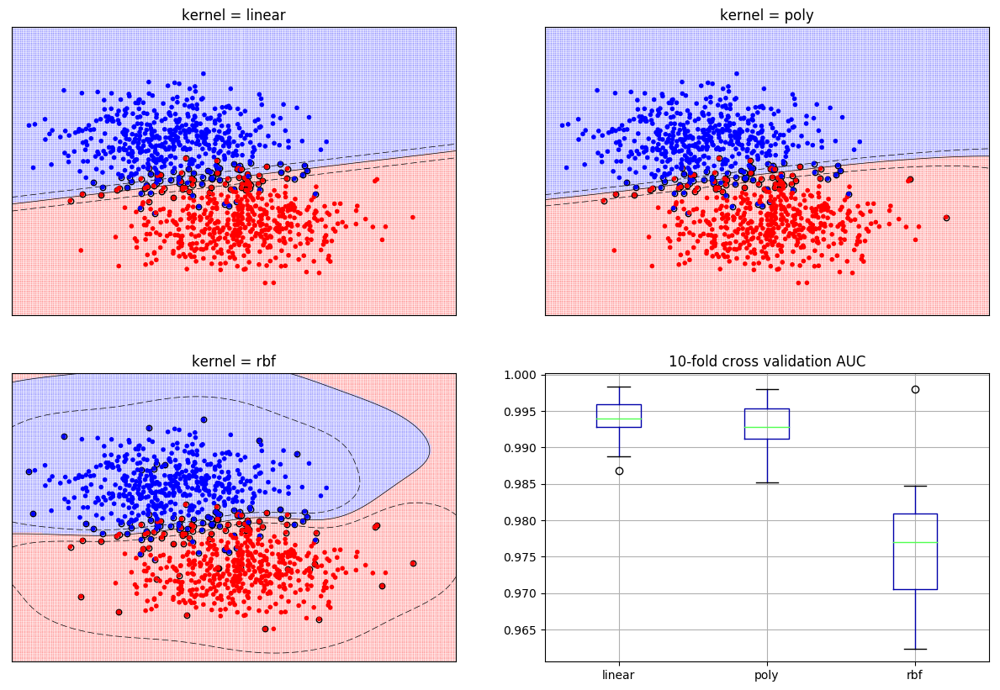

In [141]:
scores = {}
plt.figure(figsize=(15, 10));
for i, kernel in enumerate(['linear', 'poly', 'rbf']):
    clf = SVC(kernel=kernel);
    scores[kernel] = cross_val_score(clf, X, y, cv=10, scoring='roc_auc');
    clf.fit(X, y);

    #plt.figure();
    plt.subplot(2, 2, i + 1);
    plt.title('kernel = %s' % kernel);
    plot_svm(clf)


#plt.figure();
plt.subplot(2, 2, 4);
df = pd.DataFrame(list(scores.values()), index=list(scores.keys()));
df.T.boxplot(list(scores.keys()));
plt.title('10-fold cross validation AUC')
plt.show();

The linear and polynomial kernels work best in this scenario, and they produce very similar classification boundaries. It seems like the optimal separation boundary between the two blobs is actually linear, which can be modeled well by those two kernels, while the RBF kernel seems to produce a wawe-like separation boundary. This boundary has some variability which depends on the actual points used to build it, explaining why the RBF kernel has slightly lower scores; in other words, it tends to overfit the data.

- Take the RBF kernel and vary both the C parameter and the kernel width ($\gamma$). Use 3 values for each (a very small, default, and very large value). For each of the 9 combinations, create the same RBF plot as before, report the number of support vectors, and the AUC performance. Explain the performance results. When are you over/underfitting?
    - Hint: values for C and $\gamma$ are typically in [$2^{-15}..2^{15}$] on a log scale. 
    - Hint: don't count the support vectors manually, retrieve them from the trained SVM.

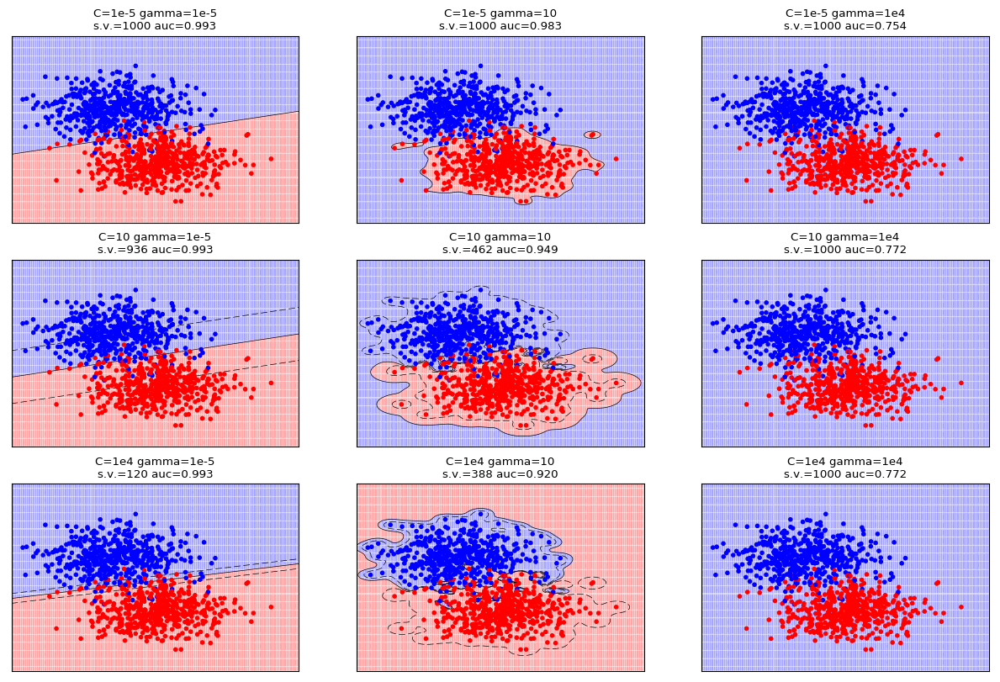

In [3]:
import mglearn

plt.figure(figsize=(15, 10));
fig_num = 0
for c in ['1e-5', '10', '1e4']:
    for gamma in ['1e-5', '10', '1e4']:
        svm = SVC(kernel='rbf', C=float(c), gamma=float(gamma))
        auc = cross_val_score(svm, X, y, cv=10, scoring='roc_auc')
        svm.fit(X, y)
        
        fig_num += 1
        plt.subplot(3, 3, fig_num);
        plt.title('C=%s gamma=%s\ns.v.=%d auc=%.3f' % (
            c, gamma, svm.support_vectors_.shape[0], auc.mean()
        ));
        plot_svm(svm, support_vectors=False);
        
plt.show();

From these plots, it seems like high gamma values lead to overfitting, while low gamma values tend to models resemble a linear model; note that the plot with C=1e4 and gamma=1e-5 is almost identical to the one produced with the linear kernel in the previous section. As gamma increases, the separation boundary closes around the points of one class.

- Vary C and $\gamma$ again, but this time use a grid of at least 20x20, vary both parameters uniformly on a log scale, and visualise the results using a $C \times \gamma \rightarrow AUC$ heatmap. Explain the performance results, and compare them to the 9 results obtained in the previous subquestion. Can you also tell in which regions of the heatmap you are over/underfitting?
    - Hint: We've constructed such a heatmap in class and in assignment 1.

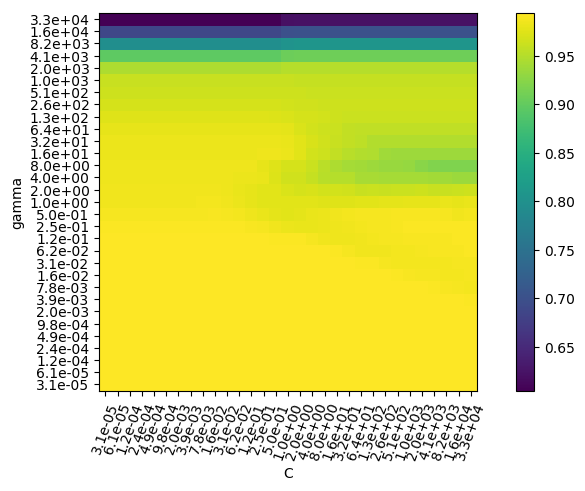

In [101]:
DEBUG = False
if DEBUG:
    print('*** DEBUG RUN ***')
    vals = [2**x for x in range(-1, 2)]
else:
    vals = [2**x for x in range(-15, 16)]
    
param_grid = {
    'C': vals,
    'gamma': vals,
}

gs = GridSearchCV(SVC(kernel='rbf'), param_grid=param_grid,
                  cv=10, n_jobs=-1, scoring='roc_auc');
gs.fit(X, y);


scores = np.array(gs.cv_results_['mean_test_score']).reshape(
    len(param_grid['C']),
    len(param_grid['gamma'])
).T;

plt.figure(figsize=(10, 5))
img = mglearn.tools.heatmap(
    scores, cmap='viridis', fmt='',
    ylabel='gamma', yticklabels=param_grid['gamma'],
    xlabel='C', xticklabels=param_grid['C'],
);
plt.setp(img.get_axes().xaxis.get_majorticklabels(),
         rotation=70);
plt.xticks(plt.xticks()[0], ['%.1e' % x for x in vals]);
plt.yticks(plt.yticks()[0], ['%.1e' % x for x in vals]);
plt.colorbar(img);

Very high gamma values lead to a prediction boundary which basically wraps every point of one class in little "bubbles", hence the high overfitting shown in both plots above. The green-ish region located in the mid-left part of the matrix corresponds to the central plot drawn in the previous point; the plots above and below it differ in the class that is "wrapped" by the separation boundary, thus it seems like that class transitions from one to the other with gamma values roughly between 2 and 50. This would make the boundary in the zone where red and blue observations overlap quite jagged, and easily affected by the training data.

## Robots and SVMs (4 points (2+1+1))

The [Wall Robot Navigation dataset](http://www.openml.org/d/1497) contains about 5500 readings of an ultrasound sensor array mounted on a robot, and your task is to finetune and train an SVM classifier to predict how the robot should move next.

In [25]:
robot_data = oml.datasets.get_dataset(1497)
X, y = robot_data.get_data(target=robot_data.default_target_attribute);


def run_random_search(X, y, **kwargs):
    vals = [2**x for x in range(-16, 16)]
    param_grids = [
        {'kernel': ['linear'], 'C': vals},
        {'kernel': ['poly'], 'C': vals, 'degree': range(2, 11)},
        {'kernel': ['rbf'], 'C': vals, 'gamma': vals},
    ]

    best_estimator = best_params = best_score = None
    for grid in param_grids:
        rs = RandomizedSearchCV(
            SVC(), param_distributions=grid, scoring='accuracy', **kwargs
        );
        _ = rs.fit(X, y);
        if not best_score or rs.best_score_ > best_score:
            best_score = rs.best_score_
            best_params = rs.best_params_
            best_estimator = rs.best_estimator_
    
    return best_estimator, best_score, best_params

- Make a stratified 80-20 split of the data. On the training set alone, optimize the main hyperparameters of the SVM for Accuracy with a random search. Vary at least the main kernel types (linear, polynomial, and RBF), the C parameter, the $\gamma$ parameter for the RBF kernel and the exponent/degree for the polynomial kernel. Report the optimal hyperparameter settings and Accuracy performance. 
    - The degree of the polynonial is typically in the range 2..10.
    - Hint: note that the hyperparameter ranges depend on each other. For instance, $\gamma$ only makes sense if you have selected the RBF kernel as well. We've seen in class how to define multiple hyperparameter spaces in a random/grid search.
- Train an SVM using the optimal hyperparameter configuration you found (in part 1 of this question) and test it on the held out (20%) test set. Compare this Accuracy result with the (mean) result of the nested CV. If you would build this robot in practice, how would you find the hyperparameters to use, and which performance would you expect? Is it truly necessary to tune the hyperparameters? Which hyperparameters were most important to tune?

In [ ]:
Xtrain, Xtest, ytrain, ytest = train_test_split(X, y, test_size=0.2);
best_estimator, best_score, best_params = run_random_search(
    Xtrain, ytrain, cv=5, n_jobs=-1, n_iter=25, verbose=3
)

clear_output()
print('Best accuracy on training set: {:.3f} with parameters {}'.format(
    best_score, best_params
))

test_accuracy = accuracy_score(ytest, best_estimator.predict(Xtest))
print('Accuracy on the holdout test set: {:.3f}'.format(test_accuracy))

Best accuracy on training set: 0.921 with parameters {'kernel': 'rbf', 'gamma': 0.001953125, 'C': 16384}
Accuracy on the holdout test set: 0.921


An SVM may too overpowered for handling the navigation of a robot, depending on the complexity of the robot itself and the environment it is expected to operate in. It would be ineffective to train the SVM using an existing dataset, since the position of the sensors might be different, there could be more or less sensors and so on; I would build a test environment and manually remote-control the robot through a number of different situations, to acquire enough sensor data and build a dataset.

Achieving the maximum possible classification performance wouldn't be so important, depending on the current performances. For example, an improvement from 80% to 85% won't have an effect as noticeable as an improvement from 94% to 99%, and improvements below 1% would have no effects at all (unless there are very strict requirements for the robot, in which case the SVM should be paired with another system).

- Use a 5x3-fold (5 outer, 3 inner) nested cross-validation (CV) on the **whole** dataset to obtain a clean evaluation. What is the mean optimized performance? Is this in line with the optimized result of the random search of the previous question?

In [ ]:
scores = []
for train_index, test_index in StratifiedKFold(5).split(X, y):
    estimator, _, _ = run_random_search(
        X[train_index], y[train_index], cv=3,
        n_jobs=-1, verbose=3, n_iter=25
    )
    scores.append(accuracy_score(
        y[test_index], best_estimator.predict(X[test_index])
    ))

clear_output()
print('Mean accuracy: {:.3f}'.format(sum(scores) / len(scores)))

Fitting 3 folds for each of 25 candidates, totalling 75 fits


[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done  75 out of  75 | elapsed: 58.9min finished


Fitting 3 folds for each of 25 candidates, totalling 75 fits


[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done  75 out of  75 | elapsed:    6.8s finished


Fitting 3 folds for each of 25 candidates, totalling 75 fits


[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:    6.9s
[Parallel(n_jobs=-1)]: Done  75 out of  75 | elapsed:   22.2s finished


Fitting 3 folds for each of 25 candidates, totalling 75 fits


[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:   37.4s


## A benchmark study (3 points (2+1))

A benchmark study is an experiment in which multiple algorithms are evaluated on multiple datasets. The end goal is to study whether one algorithm is generally better than the others. Meaningful benchmark studies can grow quite complex, here we do a simplified variant.

In [2]:
def clean_dataset(dataset):
    pipeline_steps = []
    
    ds = oml.datasets.get_dataset(dataset);
    X, y = ds.get_data(target=ds.default_target_attribute);
    
    nominal = [int(x['oml:index']) for x in ds.features['oml:feature']
               if x['oml:data_type'] == 'nominal' and x['oml:is_target'] == 'false']
    numeric = [int(x['oml:index']) for x in ds.features['oml:feature']
               if x['oml:data_type'] == 'numeric' and x['oml:is_target'] == 'false']
   
    target = [int(x['oml:index']) for x in ds.features['oml:feature']
              if x['oml:is_target'] == 'true'][0]
    nominal = [x if x < target else x - 1 for x in nominal]
    numeric = [x if x < target else x - 1 for x in numeric]
    
    if nominal:
        fill = np.nanmax(X, axis=0) + 1
        for col, val in enumerate(fill):
            if col in nominal:
                fix = np.logical_or(np.isnan(X[:, col]), np.isinf(X[:, col]))
                X[fix, col] = val
                assert np.isfinite(X[:, col].sum()) and np.isfinite(X[:, col]).all(), X
                assert np.all(np.mod(X[:, col], 1) == 0), 'not a nominal feature'
        n_values = [np.unique(X[:, x]).shape[0] for x in nominal]
        enc = OneHotEncoder(n_values=n_values, categorical_features=nominal, sparse=False)
        pipeline_steps.append(('enc', enc))

    if numeric:
        pipeline_steps.append(('imputer', Imputer()))
        pipeline_steps.append(('scaler', RobustScaler()))
    
    identifier = [int(x['oml:index']) for x in ds.features['oml:feature']
                  if x['oml:is_row_identifier'] == 'true']
    if identifier:
        idf = identifier[0] if identifier[0] < target else identifier[0] - 1
        X = np.hstack([X[:, :idf], X[:, (idf+1):]])
    return X, y, pipeline_steps


def test_estimator_on_dataset(estimator, dataset, params=None):
    X, y, pipeline_steps = clean_dataset(dataset)
    pipeline_steps.append(('est', estimator))
    
    if params:
        if isinstance(params, list):
            params = params[0]
        params = {'est__' + k: v for k, v in params.items()}
        pip = Pipeline(pipeline_steps)
        rs = GridSearchCV(pip, param_grid=params, n_jobs=-1,
                          cv=10, verbose=4)
        rs.fit(X, y)
        return rs.best_score_
    else:
        pip = Pipeline(pipeline_steps)
        scores = cross_val_score(pip, X, y, scoring='roc_auc',
                                 n_jobs=-1, cv=10)
        return scores.mean()

* Download OpenML datasets 37, 470, 1120, 1464 and 1471. They are sufficiently large (e.g., at least 500 data points) so that the performance estimation is trustworthy. Select at least three classifiers that we discussed in class, e.g. kNN, Logistic Regression, Random Forests, Gradient Boosting, SVMs, Naive Bayes. Note that some of these algorithms take longer to train. Evaluate all classifiers (with default parameter settings) on all datasets, using a 10-fold CV and AUC. Show the results in a table and interpret them. Which is the best algorithm in this benchmark?
    * Note that these datasets have categorical features, different scales, missing values, and (likely) irrelevant features. You'll need to build pipelines to correctly build all models. Also remove any row identifiers (see, e.g., https://www.openml.org/d/1120)
    * Hint: You can either compare the performances directly, or (better) use a statistical significance test, e.g. a pairwise t-test or (better) Wilcoxon signed ranks test, to see whether the performance differences are significant. This is covered in statistics courses. You can then count wins, ties and losses.
* Repeat the benchmark, but now additionally optimize the main hyperparameters of each algorithm in a grid or random search (explore at least 5 values per hyperparameter, where possible). Does this affect the ranking of the algorithms?

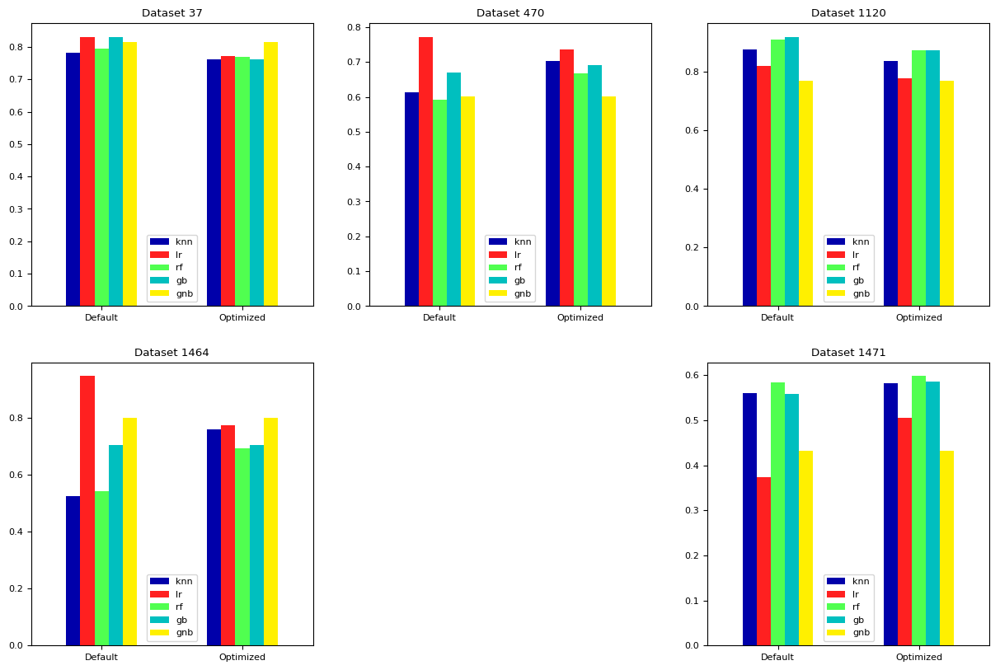

In [29]:
estimators = [
    ('knn', KNeighborsClassifier(), {
        'n_neighbors': [1, 2, 3, 4, 5, 10, 15, 20, 50, 100]
    }),
    ('lr', LogisticRegression(), {
        'C': [2**x for x in range(-16, 17)]
    }),
    ('rf', RandomForestClassifier(), {
        'n_estimators': [2**x for x in range(0, 10)]
    }),
    ('gb', GradientBoostingClassifier(), {
        'learning_rate': [2**x for x in range(-5, 1)],
        'n_estimators': [500],
    }),
    ('gnb', GaussianNB(), None)
]

datasets = [37, 470, 1120, 1464, 1471]

fig = plt.figure(figsize=(15, 10));
for i, ds in enumerate(datasets):
    scores = []
    for name, est, grid in estimators:
        print(ds, name)
        default_score = test_estimator_on_dataset(est, ds, None)
        optimized_score = test_estimator_on_dataset(est, ds, grid)
        scores.append((default_score, optimized_score))
        clear_output()

    scores = pd.DataFrame(scores, index=[name for name, _, _ in estimators],
                          columns=['Default', 'Optimized']);
    sub = fig.add_subplot(2, 3, (i + 1) if i != 4 else 6);
    img = scores.T.plot(kind='bar', ax=sub, title='Dataset %d' % ds, rot=0)
fig.show()

## Gaussian Processes (2 points (1+1))

Consider the RAM prices dataset (included in the data folder). Separate the data in a training set of all data points up until the year 2000, and a test set with all points after that.

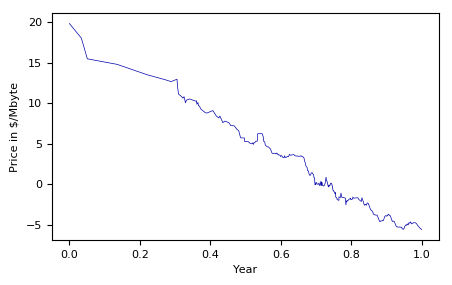

In [12]:
ram_prices = pd.read_csv('data/ram_price.csv')

scaler_x = MinMaxScaler().fit(
    np.array(ram_prices.date).reshape((len(ram_prices), 1))
)

scaler_y = MinMaxScaler().fit(
    np.array(ram_prices.price).reshape((len(ram_prices), 1))
)

def split(cond, scale=True):
    df = ram_prices[cond] if cond is not None else ram_prices
    X = np.array(df.date).reshape((len(df), 1))
    y = np.array(df.price)
    
    if scale:
        return scaler_x.transform(X), np.log(y)
    
    return X, y


def split_test(cond, scale=True):
    train = split(cond, scale)
    test = split(~cond, scale) if cond is not None else ([], [])
    return train, test


Xtrain, ytrain = split(ram_prices.date < 2000)
Xtest, ytest = split(ram_prices.date >= 2000)
Xscal, yscal = split(None)

plt.plot(Xscal, yscal);
plt.xlabel("Year");
plt.ylabel("Price in $/Mbyte");

- Train several of the algorithms we have covered in the course that can handle regression. Include at least linear regression, decision tree, and RandomForest. Which ones give the best $R^2$ performance on the test set? Plot the predictions (both on the training and test data) on the figure below. Use different colors for different algorithms or build multiple plots.

R^2 of KernelRidge on test set: -7.85
R^2 of LinearRegression on test set: 0.83
R^2 of DecisionTreeRegressor on test set: -3.79
R^2 of RandomForestRegressor on test set: -3.86


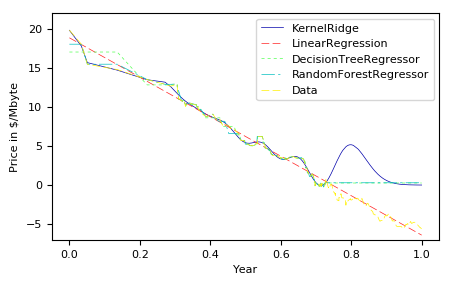

In [19]:
def fit_eval(rs):
    rs.fit(Xtrain, ytrain)
    r2 = r2_score(ytest, rs.predict(Xtest))
    return rs.best_estimator_, r2


def train_linear_regression():
    lr = LinearRegression();
    lr.fit(Xtrain, ytrain);
    return lr, r2_score(ytest, lr.predict(Xtest))


def train_decision_tree():
    grid = {
        'min_samples_split': [2**x for x in range(1, 6)],
        'min_samples_leaf': [2**x for x in range(0, 6)],
    }
    return fit_eval(RandomizedSearchCV(DecisionTreeRegressor(), cv=10, n_jobs=-1,
                                       n_iter=10, param_distributions=grid))


def train_random_forest():
    grid = {
        'n_estimators': [2**x for x in range(0, 6)],
    }
    return fit_eval(GridSearchCV(RandomForestRegressor(), cv=5,
                                 n_jobs=-1, param_grid=grid))


def train_kernel_ridge():
    alphas = [2**x for x in range(-15, 15)]
    grid = [
        {'kernel': ['linear'], 'alpha': alphas},
        {'kernel': ['rbf'], 'alpha': alphas, 'gamma': alphas},
        {'kernel': ['poly'], 'alpha': alphas, 'degree': list(range(2, 11))},
    ]
    return fit_eval(GridSearchCV(KernelRidge(), cv=5, n_jobs=-1,
                                 param_grid=grid))


estimators = [
    train_kernel_ridge(),
    train_linear_regression(),
    train_decision_tree(),
    train_random_forest(),
]

for est, r2 in estimators:
    X, y = split(None)
    plt.plot(X, est.predict(X), label=est.__class__.__name__);
    print('R^2 of %s on test set: %.3g' % (est.__class__.__name__, r2));

plt.plot(Xscal, yscal, label='Data')
plt.legend(loc='auto')
plt.xlabel('Year');
plt.ylabel('Price in $/Mbyte');
#plt.ylim((1e-3, 1e9));
plt.ylim((-7, 22))
plt.show();

- Train a Gaussian process on an increasing amount of samples of the training data. Start with 5 random sample and plot the predictions (both the mean and the uncertainty interval) for both training and test data, as shown in class. Now add 5 more points and retrain and redraw. Do this a couple of times and interpret/explain what you see. Finally, train the Gaussian on the full dataset and again show plot the predictions. Evaluate on the test set using  $R^2$. Compare these results with those achieved with other algorithms and explain.

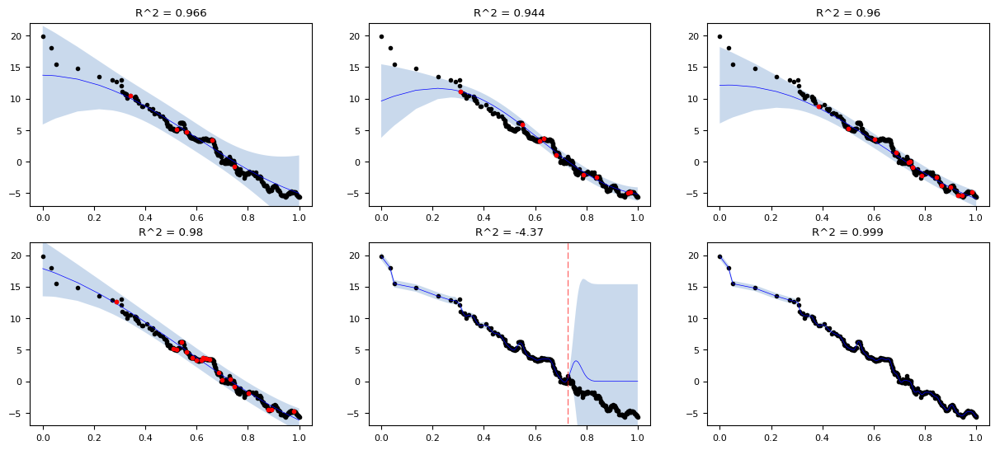

In [13]:
sets = [
    split_test(ram_prices.index.isin(np.random.randint(len(ram_prices), size=5))),
    split_test(ram_prices.index.isin(np.random.randint(len(ram_prices), size=10))),
    split_test(ram_prices.index.isin(np.random.randint(len(ram_prices), size=15))),
    split_test(ram_prices.index.isin(np.random.randint(len(ram_prices), size=20))),
    split_test(ram_prices.date < 2000),
    split_test(None),
]

Xtest, ytest = split(ram_prices.date >= 2000)

from sklearn.gaussian_process import kernels

fig = plt.figure(figsize=(15, 10))
for i, ((Xtr, ytr), (Xtst, ytst)) in enumerate(sets):
    kernel = kernels.WhiteKernel(1.0, (1e-3, 1e1)) + ConstantKernel(1.0, (1e-5, 1e5)) * RBF(10.0, (1e-5, 1e5))
    gp = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=10) #, normalize_y=True)
    gp.fit(Xtr, ytr);
    y_pred, sigma = gp.predict(Xscal, return_std=True)
    
    plt.subplot(3, 3, i + 1);
    plt.plot(Xscal, yscal, 'k.');
    plt.plot(Xscal, y_pred, 'b-');
    plt.fill(np.concatenate([Xscal, Xscal[::-1]]),
             np.concatenate([y_pred - 1.9600 * sigma,
                            (y_pred + 1.9600 * sigma)[::-1]]),
             alpha=.5, fc='#95b5db', ec='None');
    plt.ylim((-7, 22))
    
    if i == 4:
        plt.plot([Xtr[-1], Xtr[-1]], [-1e10, 1e10], 'r--');
    elif i < 4:
        plt.plot(Xtr, ytr, 'r.');

    if len(Xtst) > 0:
        r2 = r2_score(ytst, gp.predict(Xtst));
    else:
        r2 = r2_score(ytr, gp.predict(Xtr));

    plt.title('R^2 = %.3g' % r2)

clear_output();

### A mini-data mining challenge (2 points (+1))

The goal here is to use everything you have learned to build the best model for a given classification task. The task is hosted on OpenML, so you will receive the train-test splits, and your model will be evaluated on the server. The goal is to reasonably select algorithms and hyperparameter settings to obtain the best model. You can also do model selection and parameter optimization as you have done before. Skeleton code is provided in the OpenML tutorial.

- All details can be found online:
    - The OpenML Task ID is 145677: https://www.openml.org/t/145677
    - The dataset description can be found here: https://www.openml.org/d/4134
- A leaderboard is kept of the best models: https://www.openml.org/t/145677#!people
    - You are able to see the solutions of others (by clicking in the timeline or run list), but resubmission of the exact same solution does not register on the leaderboard.
    - You can share one account (one API key) per team. In case you use two, we take the one that performs best.
- You can document the different experiments that you ran in this notebook. For each experiment, provide a description of how you chose the algorithms and parameters that you submitted. Try to reason about which experiments to try, don't just do an immense random search.
- Points are rewarded as follows:
    - 1 point for the breadth of experiments you ran (algorithms, hyperparameter settings)
    - 1 point for reasoning/insight and interpretation of the results
    - 1 (bonus) point for every team who has uploaded the best solution thus far **on AUC** (who reaches the top of the leaderboard at any moment during the assignment)
        - Note: On the leaderboard page, the 'frontier' line is drawn, and your top ranking is also shown in the table.
        
Note: Report AUC scores in your report as well. In case of issues with OpenML we will use the experiments and scores mentioned your report.

In [3]:
task = tasks.get_task(145677)

svd_params = {
    'red': [TruncatedSVD()],
    'red__n_components': [10, 50, 100],
}

kbest_params = {
    'red': [SelectKBest()],
    'red__score_func': [f_regression],
    'red__k': [10, 50, 100],
}

mod_params = {
    'red': [SelectFromModel(RandomForestClassifier())],
    'red__estimator__max_features': [0.1],
    'red__estimator__n_estimators': [64],
}


def test(estimator, grid, n_iter=10, feature_selection=True):
    X, y = shuffle(*task.get_X_and_y())
    
    est_params = {'est__' + k: v for k, v in grid.items()}
    
    search_est = Pipeline([
        ('red', None),
        ('est', estimator)
    ]) if feature_selection else estimator
    
    search_grid = [
        dict(**est_params),
        dict(**est_params, **svd_params),
        dict(**est_params, **kbest_params),
        dict(**est_params, **mod_params),
    ] if feature_selection else grid
    
    gs = GridSearchCV(search_est, param_grid=search_grid, cv=5,
                      n_jobs=-1, scoring='roc_auc', verbose=3);
    gs.fit(X, y);
    clear_output()
    
    return gs.best_score_, gs.best_params_

In [4]:
best = test(RandomForestClassifier(), {
    'n_estimators': [2**x for x in range(4, 10, 2)],
    'max_features': np.arange(0.1, 0.6, 0.1),
    'min_samples_split': [2**x for x in range(1, 5)],
    'min_samples_leaf': [2**x for x in range(1, 5)],
}, feature_selection=False)
print('rf best score: {:.3f} obtained with params {}'.format(*best))

rf best score: 0.879 obtained with params {'max_features': 0.10000000000000001, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 256}


In [5]:
best = test(LogisticRegression(), {
    'C':  [2**x for x in range(-24, 12, 3)],
})

print('lr best score: {:.3f} obtained with params {}'.format(*best))

lr best score: 0.835 obtained with params {'est__C': 0.015625}


In [7]:
best = test(KNeighborsClassifier(), {
    'n_neighbors': [1, 3, 5, 7, 10, 25],
})

print('knn best score: {:.3f} obtained with params {}'.format(*best))

knn best score: 0.837 obtained with params {'est__n_neighbors': 5, 'red': SelectFromModel(estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features=0.1, max_leaf_nodes=None,
            min_impurity_split=1e-07, min_samples_leaf=1,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            n_estimators=64, n_jobs=1, oob_score=False, random_state=None,
            verbose=0, warm_start=False),
        prefit=False, threshold=None), 'red__estimator__max_features': 0.1, 'red__estimator__n_estimators': 64}


In [9]:
best = test(SVC(), {
    'kernel': ['rbf'],
    'C': [2**x for x in range(-15, 15, 3)],
    'gamma': [2**x for x in range(-15, 15, 3)],
})

print('svc best score: {:.3f} obtained with params {}'.format(*best))

svc best score: 0.864 obtained with params {'est__C': 1, 'est__gamma': 0.125, 'est__kernel': 'rbf', 'red': SelectFromModel(estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features=0.1, max_leaf_nodes=None,
            min_impurity_split=1e-07, min_samples_leaf=1,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            n_estimators=64, n_jobs=1, oob_score=False, random_state=None,
            verbose=0, warm_start=False),
        prefit=False, threshold=None), 'red__estimator__max_features': 0.1, 'red__estimator__n_estimators': 64}


In [ ]:
final = RandomForestClassifier(
    max_features=0.1, min_samples_leaf=2, min_samples_split=4,
    n_estimators=256, n_jobs=-1
)

#run = runs.run_task(task, final)
#run.publish()
#print("Uploaded run with id %s. Check it at www.openml.org/r/%s" %(run.run_id,run.run_id))